# **PRÁCTICA GUIADA 01**

Grupo: 08

## **ALUMNOS:**

*   Mildred Micaela Marchan Quispe
*   Rody Sebastian Vilchez Marin
*   Rosa Maria Rodríguez Valencia



### Objetivos 
1. Realizar el EDA utilizando la herramienta  sweetviz del siguiente dataset. https://raw.githubusercontent.com/ProjectMOSAIC/NHANES/master/data-raw/NHANES.csv
2. Escoger por lo menos una división de datos por alumno para examinar las particiones de datos.
3. Investigue como exportar el informe EDA en formato HTML.
4. Investigue alguna otra herramienta similar a sweetviz para hacer el EDA. Realice el EDA con la 
herramienta investigada. Y haga un análisis comparativo de ambas herramientas. 


### Overview del dataset

Estamos trabajando con una muestra de un conjunto de datos de salud pública de los Estados Unidos, los datos fueron recopilados mediante encuestas, entrevistas y exámenes médicos. El conjunto de datos contiene información demográfica, de salud y nutricional de los participantes, así como datos sobre sus hábitos de vida y condiciones médicas.

Los datos corresponden a una sampleo de la fuente primaria [NHANES](https://www.cdc.gov/nchs/nhanes/index.htm)

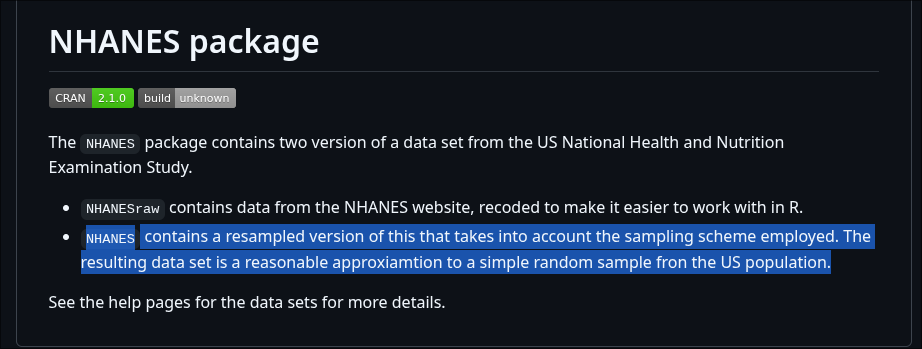

Fuente: [Repositorio de Github del proyecto MOSAIC](https://github.com/ProjectMOSAIC/NHANES)


### Librerias

In [1]:
!pip install numpy==1.26.4 -q # resetear entorno en colab

In [2]:
!pip install sweetviz -q

In [15]:
!pip intall ydata-profiling ipywidgets -q


ERROR: unknown command "intall" - maybe you meant "install"


In [3]:
import warnings
warnings.simplefilter(action="ignore")

import pandas as pd # cargar y manipular datos
import sweetviz as sv # herramienta de análisis exploratória
import seaborn as sns # gráficos
import matplotlib.pyplot as plt # gráficos
import numpy as np # procesamiento matemático
from scipy.stats import norm # normal

### Ingesta de datos

In [4]:
df = pd.read_csv("https://raw.githubusercontent.com/ProjectMOSAIC/NHANES/master/data-raw/NHANES.csv",index_col=0)
df.shape

(10000, 74)

In [5]:
print(df.isnull().sum().sum(), "valores nulos en el dataset")
print(df.duplicated().sum(), "valores duplicados en el dataset")

279722 valores nulos en el dataset
2168 valores duplicados en el dataset


In [6]:
df.sample(5)

,ID,Gender,Age,AgeDecade,AgeMonths,Race1,Race3,Education,MaritalStatus,HHIncome,...,AgeFirstMarij,RegularMarij,AgeRegMarij,HardDrugs,SexEver,SexAge,SexNumPartnLife,SexNumPartYear,SameSex,SexOrientation
SurveyYr,,,,,,,,,,,,,,,,,,,,,
2009_10,59463,female,54,50-59,659.0,White,NaN,HighSchool,Married,35000-44999,...,NaN,No,NaN,No,Yes,20.0,1.0,1.0,No,Heterosexual
2011_12,66185,female,2,0-9,NaN,White,White,NaN,NaN,10000-14999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009_10,60686,female,8,0-9,96.0,White,NaN,NaN,NaN,5000-9999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2009_10,53135,female,26,20-29,313.0,White,NaN,CollegeGrad,NeverMarried,45000-54999,...,NaN,No,NaN,No,No,NaN,0.0,0.0,No,Heterosexual
2011_12,63847,male,58,50-59,NaN,White,White,HighSchool,NeverMarried,25000-34999,...,22.0,No,NaN,No,Yes,20.0,15.0,0.0,No,Heterosexual


## 1. Sweetviz

### 1.1 EDA crudo


                                             |          | [  0%]   00:00 -> (? left)

Report sweetviz_raw_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
---
(likely due to only having a single row, containing non-NaN values for both correlated features)
Affected correlations:['Age/HeadCirc', 'HeadCirc/Age']



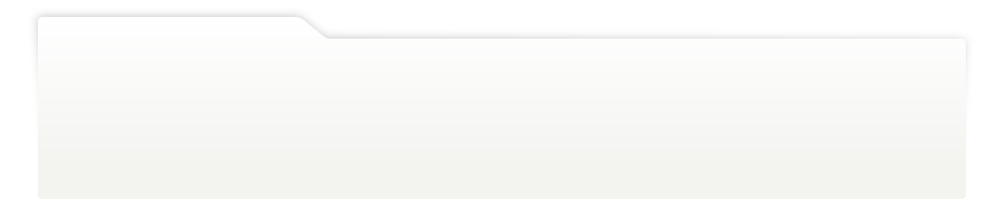
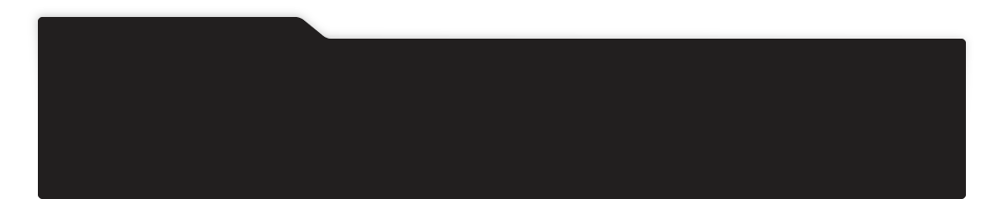
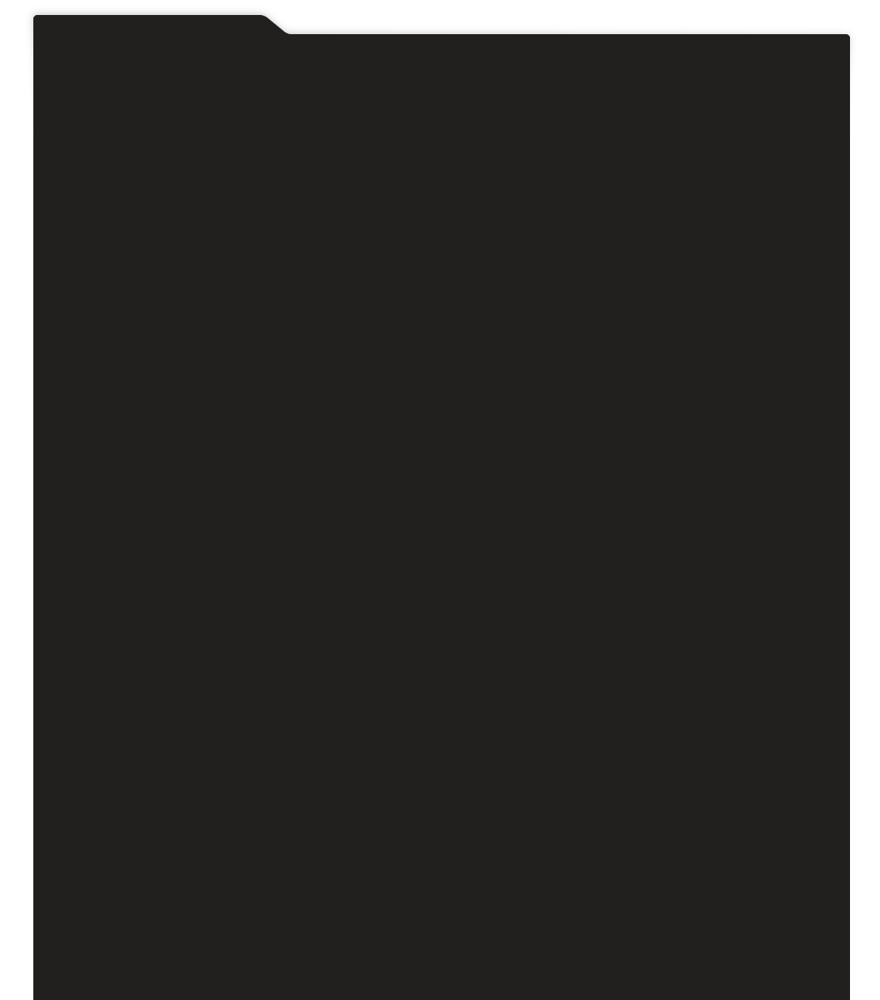
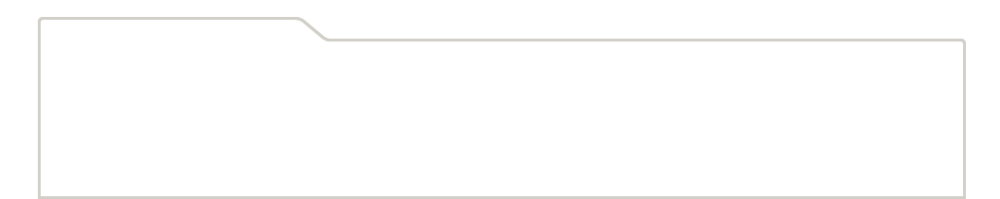
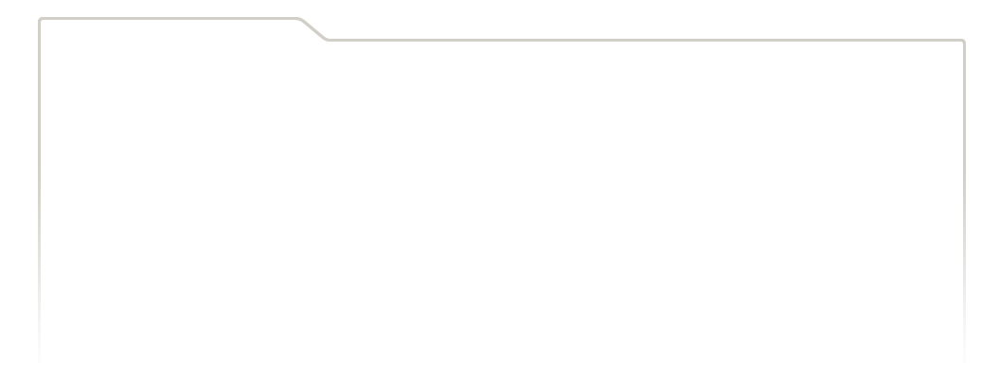
...
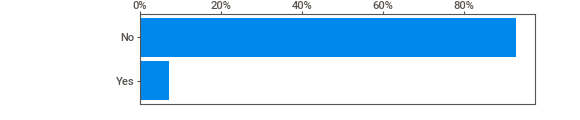
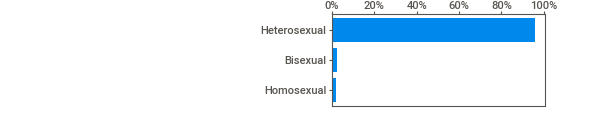
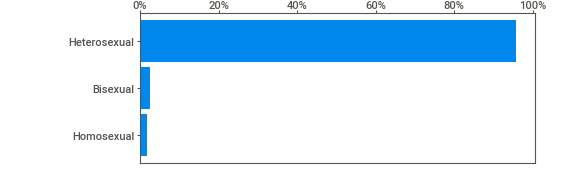
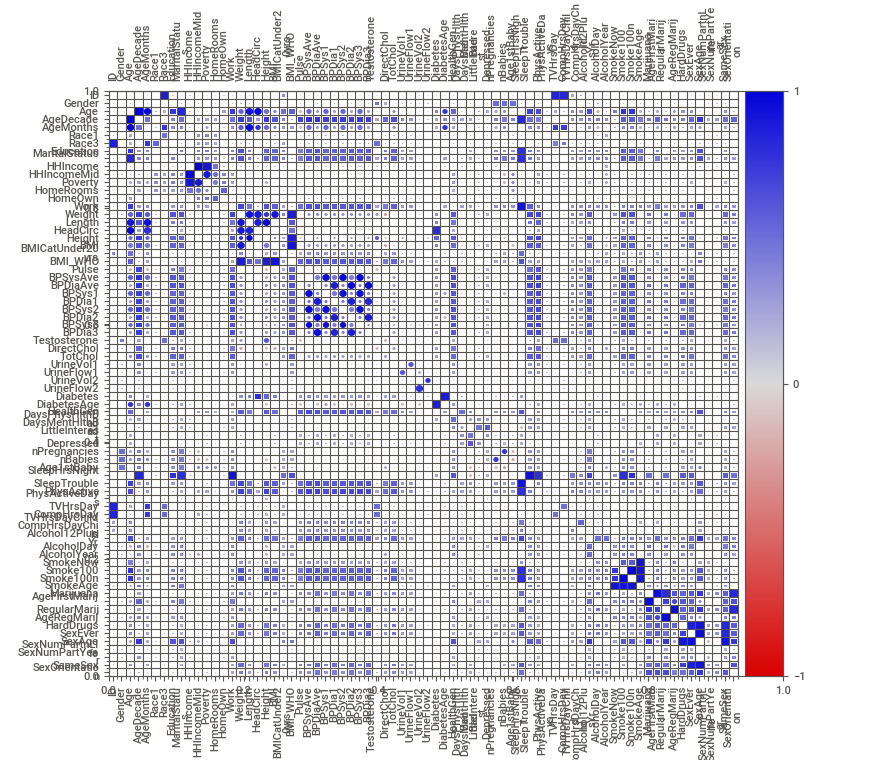
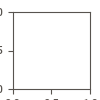

(likely due to only a single row containing non-NaN values for both correlated features)
Affected correlations:['Age/HeadCirc', 'HeadCirc/Age']


In [7]:
report = sv.analyze(df)
report.show_notebook() # EDA en notebook (Obj. 1)


## 1.2 Divisiones de datos 

### 1.2.1 EDA segmentado por nivel de ingresos 

Se realizo una dicotomizacion arbitriaria del nivel de ingresos en dos grupos, bajos ingresos y altos ingresos, con la finalidad de observar las diferencias entre ambos grupos en las variables del dataset. 

In [8]:
"""
En esta ocasion fue conveniente complementar con este codigo
para copiar y pegar las categorias, evitando/corrigiendo errores de tipeo
y de ordenamiento al seleccionar por indice. 
"""

f_income = df['HHIncome'].unique() 
f_income 

array(['more 99999', '75000-99999', '20000-24999', '45000-54999',
       '25000-34999', '15000-19999', '10000-14999', '65000-74999', nan,
       '35000-44999', ' 5000-9999', '55000-64999', ' 0-4999'],
      dtype=object)

In [ ]:
hight_income = df[df["HHIncome"].isin(["more 99999", "75000-99999", "65000-74999", "55000-64999","45000-54999"])]
low_income = df[df["HHIncome"].isin([ "35000-44999", "25000-34999","20000-24999","10000-14999", "5000-9999", "0-4999"])]

income_report = sv.compare(
    [low_income, "Bajos ingresos(5)"], 
    [hight_income, "Altos ingresos(6)"],
    pairwise_analysis="off" # se sopecha MAR 
    )


                                             |          | [  0%]   00:00 -> (? left)


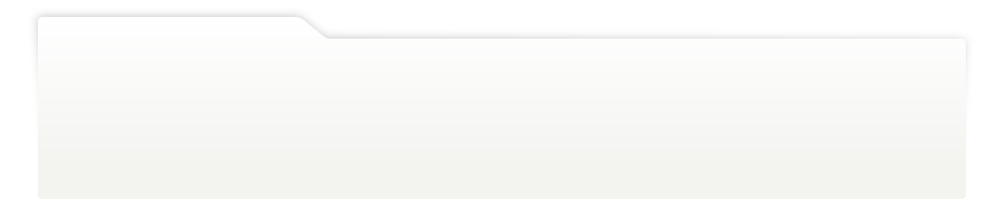
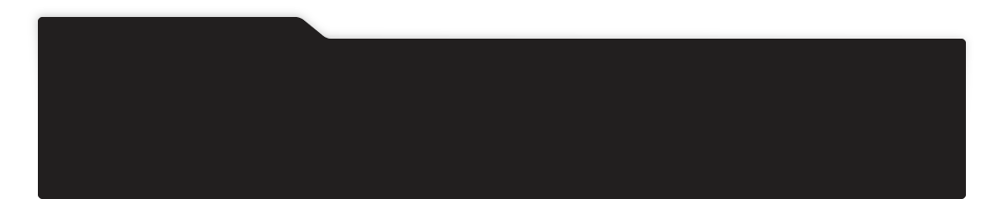
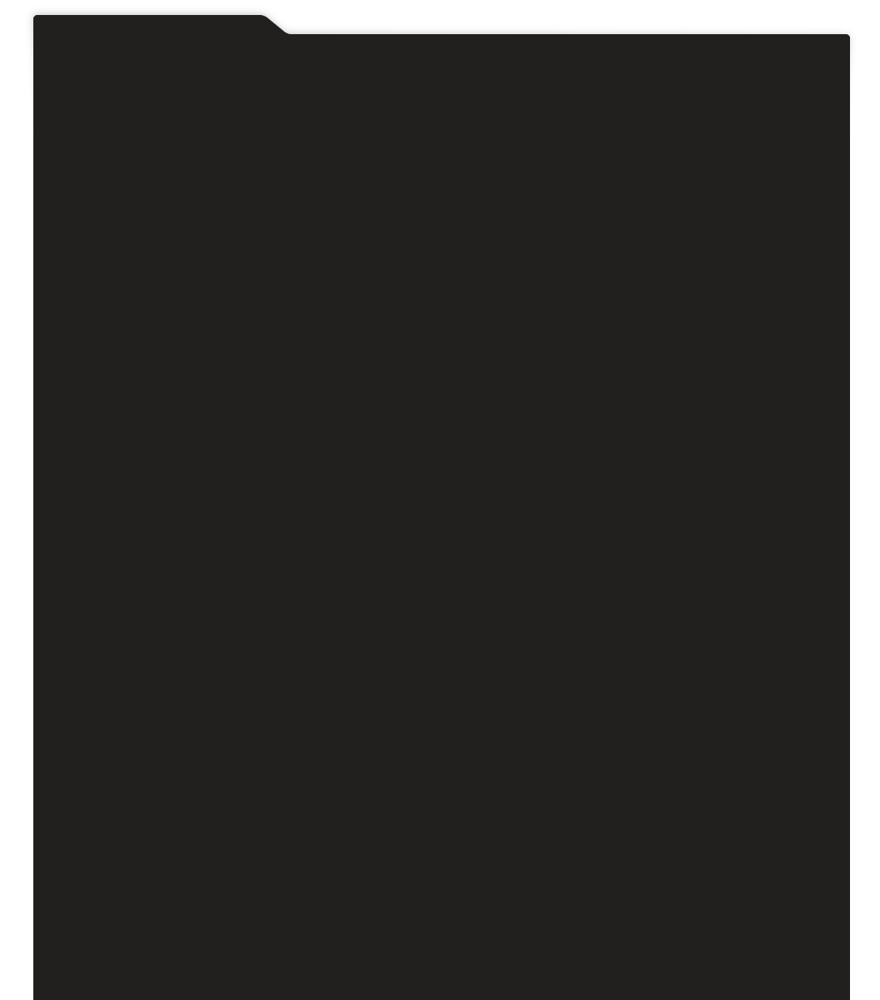
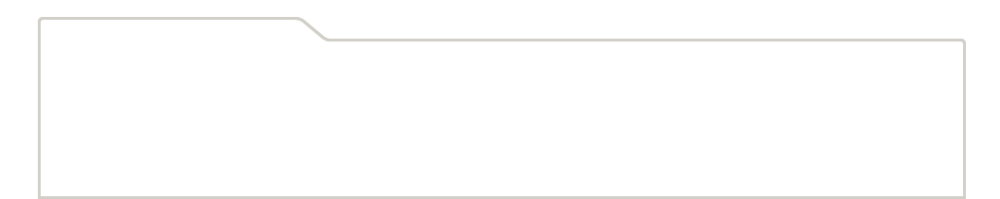
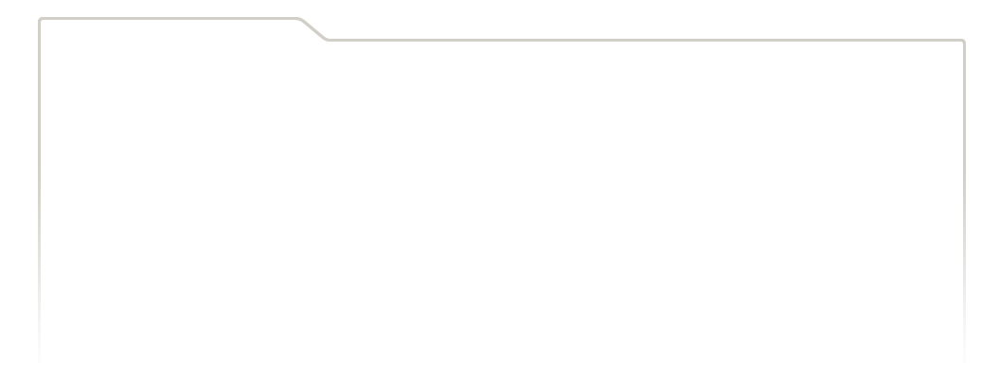
...
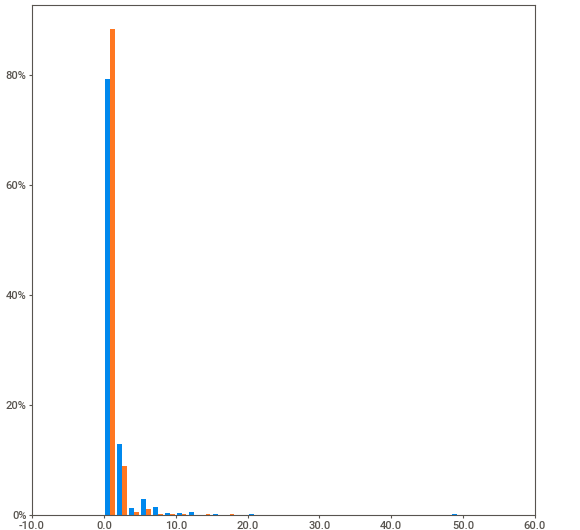
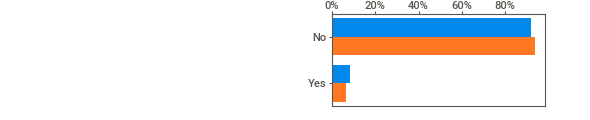
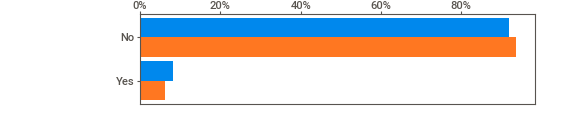
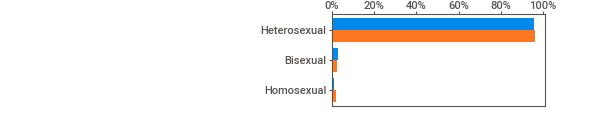
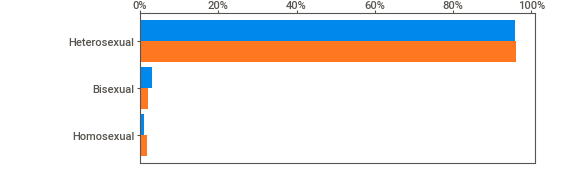

In [ ]:
income_report.show_notebook()

## 1.2.2 EDA segmentado por nivel de educación

Se realizo una dicotomizacion arbitriaria del nivel de educación en dos grupos, bajos niveles de educación y altos niveles de educación, donde bajo nivel de educación se considera inferior a secundaria completa y alto nivel de educación se considera desde estudios universitarios incompletos

In [14]:
low_vals  = ["8thGrade", "9_11thGrade"]
high_vals = ["SomeCollege", "CollegeGrad"]

low_edu  = df[df["Education"].isin(low_vals)].copy()
high_edu = df[df["Education"].isin(high_vals)].copy()

edu_report = sv.compare(
    [low_edu, "Baja educacion(2)"], 
    [high_edu, "Alta educacion(2)"],
    pairwise_analysis="off"
    )
edu_report.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)

## 1.2.3 Problemas de sueño

In [12]:

# División por problemas de sueño
sleep_trouble = df[df['SleepTrouble'] == 'Yes']
no_sleep_trouble = df[df['SleepTrouble'] == 'No']

# Comparar ambos grupos con Sweetviz
sleep_report = sv.compare([sleep_trouble, "Con Problemas de Sueño"], [no_sleep_trouble, "Sin Problemas de Sueño"])
sleep_report.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)

Report NHANES_sleeptrouble_comparison.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
income_report.to_file("NHANES_income_comparison.html") # exportar informe a HTML (Obj. 2)
edu_report.to_file("NHANES_education_comparison.html") # exportar informe a HTML (Obj. 2)
sleep_report.to_file('NHANES_sleeptrouble_comparison.html') # exportar informe a HTML (Obj. 2)

In [21]:
from ydata_profiling import ProfileReport

raw_profile = ProfileReport(df, title="NHANES Profiling Report", explorative=True)

COMPU_POTENTE = False  # No puedo ejecutar en 4060 i2600k 26GB como servidor SSH y laptop i5 10ma 16GB RAM en vscode

if COMPU_POTENTE:
    raw_profile.to_notebook_iframe()
else:
    raw_profile.to_file("NHANES_EDA_report.html") 


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 74/74 [00:00<00:00, 84.94it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
high_income_profile = ProfileReport(hight_income)
low_income_profile = ProfileReport(low_income)
high_income_profile.compare(low_income_profile).to_file("ydata_income_profie.html")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 74/74 [00:00<00:00, 170.50it/s]


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 74/74 [00:00<00:00, 1074.57it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:

high_edu_profile = ProfileReport(high_edu, minimal=True)
low_edu_profile = ProfileReport(low_edu, minimal=True)
high_edu_profile.compare(low_edu_profile).to_file("ydata_education_profie.html")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 74/74 [00:00<00:00, 521644.53it/s]


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 74/74 [00:00<00:00, 529656.14it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:

sleep_trouble_profile = ProfileReport(sleep_trouble)
no_sleep_trouble_profile = ProfileReport(no_sleep_trouble)
sleep_trouble_profile.compare(no_sleep_trouble_profile).to_file("ydata_sleeptrouble_profie.html")


| Tema                           | **Sweetviz**                                                     | **YData-Profiling (pandas-profiling)**                                    |
| ------------------------------ | ---------------------------------------------------------------- | ------------------------------------------------------------------------- |
| **Enfoque**                    | Visual y comparativo (target, dataset vs dataset, intra-grupo).  | Perfilado EDA amplio: stats, correlaciones, missing, duplicados, alertas. |
| **Instalación**                | `pip install sweetviz`                                           | `pip install ydata-profiling`                                             |
| **Uso básico**                 | `sv.analyze(df)`                                                 | `ProfileReport(df, explorative=True)`                                     |
| **Comparar datasets**          | `sv.compare([df1,"A"], [df2,"B"])`                               | `ProfileReport(df1).compare(ProfileReport(df2))`                          |
| **Comparar grupos (mismo df)** | `sv.compare_intra(df, cond, ["True","False"])`                   | No tiene “intra” directo; deberías filtrar y generar dos reports.         |
| **Render en notebook**         | `report.show_notebook()` (simple).                               | `report.to_notebook_iframe()` → requiere **ipywidgets**.                  |
| **Exportar**                   | `report.show_html("out.html")`                                   | `report.to_file("out.html")`                                              |
| **Rendimiento**                | Ligero en medianos; muy grande puede tardar.                     | Completo pero más pesado; usar `minimal=True` para grandes.               |
| **Alertas de calidad**         | Básicas/visuales.                                                | Muchas alertas (constantes, alta cardinalidad, skew, etc.).               |
| **Correlaciones**              | Algunas vistas; foco en comparación.                             | Varias (Pearson/Spearman/Kendall), matrices e interacciones.              |
| **Valores perdidos**           | Resumen y gráficos claros.                                       | Mapas, heatmaps, patrones de missing, estimaciones.                       |
| **Interactividad**             | HTML navegable; enfoque gráfico.                                 | HTML navegable; múltiples pestañas y secciones técnicas.                  |
| **Temas/estilo**               | No tiene `theme` en `show_notebook()` (pasar `theme=` da error). | Sin “temas” como tal; look estándar del reporte.                          |
| **Dependencias extra**         | Ninguna especial para notebook.                                  | **ipywidgets** para ver inline en notebook.                               |
| **Cuándo elegirlo**            | Comparar **A vs B** rápido, presentar a no-técnicos.             | Auditoría EDA **profunda** y checklist de calidad de datos.               |


YData-Profiling (sin minimal=True)




Empleo 9G por profile y 11G al comparar los profiles. 
Hilos disponibles 14/16. Hilos usados  3/14 
Tiempo 3:36 minutos en generar el reporte comparativo.

YData-Profiling (con minimal=True)

Empleo 12G por profile y 12G al comparar los profiles. 
Hilos disponibles en el entorno 14/16. Hilos usados 3/14 
Ademas demoro mas de 2.04 minutos en generar el reporte comparativo.


### Comparacion de herramientas EDA (Obj 4)
El informe que genera Sweetviz es mucho más intuitivo e interactivo, y en la mayoría de casos trae la información suficiente para hacer un buen análisis exploratorio. Pero si lo ponemos frente a ydata-profiling, se queda un poco corto en la cantidad de detalles que ofrece.

Con ydata-profiling obtienes un informe bastante más completo y profundo, con cosas útiles antes de modelar, como alertas sobre la calidad de los datos, correlaciones, duplicados, valores atípicos, etc. En cambio, una gran ventaja de Sweetviz es que los reportes son mucho más livianos, se generan rápido y, la verdad, muchas veces no necesitamos tanta información técnica como la que entrega ydata.

Al final, usar uno u otro depende del contexto: si quieres algo rápido y visual para empezar, Sweetviz funciona bien; si necesitas un análisis más detallado y riguroso de los datos, ahí conviene más ydata-profiling.

